In [1]:
from PIL import Image

In [3]:
im = Image.open(r"C:\\Users\\Muhammad Ahmed\\Desktop\\AI and database\\17th March 2021 Numpy test 2\\Ahmed.jpg")

In [4]:
im.show()

In [5]:
print(im.size)
print(im.mode)

(3541, 3456)
RGB


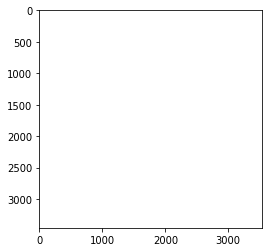

In [6]:
import numpy as np

import matplotlib.pyplot as plt

import matplotlib.image as mpimg

def rgb2gray(rgb):

    return np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140])

img = mpimg.imread('Ahmed.jpg')     

gray = rgb2gray(img)    

plt.imshow(gray, cmap=plt.get_cmap('gray'), vmin=0, vmax=1)

plt.show()

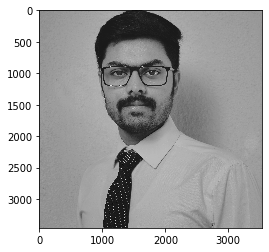

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.144])

img = mpimg.imread('Ahmed.jpg')

gray = rgb2gray(img)

plt.imshow(gray, cmap = plt.get_cmap('gray'))

In [9]:
im.show()

In [10]:
# Assuming the image has channels as the last dimension.
# filter.shape -> (kernel_size, kernel_size, channels)
# image.shape -> (width, height, channels)
def convolve(image, filter, padding = (1, 1)):
    # For this to work neatly, filter and image should have the same number of channels
    # Alternatively, filter could have just 1 channel or 2 dimensions
    
    if(image.ndim == 2):
        image = np.expand_dims(image, axis=-1) # Convert 2D grayscale images to 3D
    if(filter.ndim == 2):
        filter = np.repeat(np.expand_dims(filter, axis=-1), image.shape[-1], axis=-1) # Same with filters
    if(filter.shape[-1] == 1):
        filter = np.repeat(filter, image.shape[-1], axis=-1) # Give filter the same channel count as the image
    
    #print(filter.shape, image.shape)
    assert image.shape[-1] == filter.shape[-1]
    size_x, size_y = filter.shape[:2]
    width, height = image.shape[:2]
    
    output_array = np.zeros(((width - size_x + 2*padding[0]) + 1, 
                             (height - size_y + 2*padding[1]) + 1,
                             image.shape[-1])) # Convolution Output: [(W−K+2P)/S]+1
    
    padded_image = np.pad(image, [
        (padding[0], padding[0]),
        (padding[1], padding[1]),
        (0, 0)
    ])
    
    for x in range(padded_image.shape[0] - size_x + 1): # -size_x + 1 is to keep the window within the bounds of the image
        for y in range(padded_image.shape[1] - size_y + 1):

            # Creates the window with the same size as the filter
            window = padded_image[x:x + size_x, y:y + size_y]

            # Sums over the product of the filter and the window
            output_values = np.sum(filter * window, axis=(0, 1)) 

            # Places the calculated value into the output_array
            output_array[x, y] = output_values
            
    return output_array

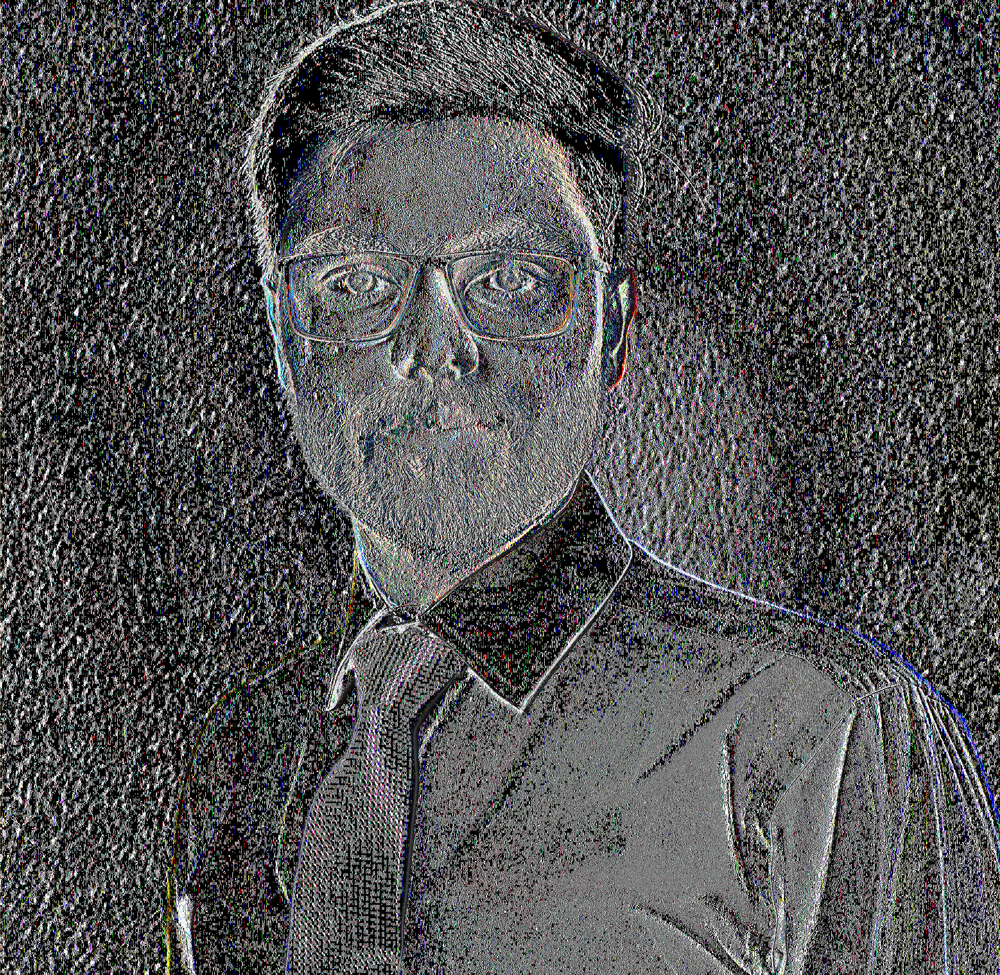

In [17]:
filter = np.array([
    [-1, 0, 1],
    [-1, 0, 1],
    [-1, 0, 1]
], dtype=np.float32) # Box Filter

#image = Image.open('Ahmed.jpg')
image_arr = np.array(im)/255.0

convolved_arr = convolve(image_arr, filter, padding=(1, 1))
convolved = Image.fromarray(np.uint8(255 * convolved_arr), 'RGB') # Convolved Image
convolved

In [25]:
convolved_arr.shape

(3456, 3541, 3)